# 1. Data & Library

In [1]:
pip install chart-studio

     |████████████████████████████████| 71kB 5.2MB/s 


In [1]:
# 연산
import numpy as np
import pandas as pd

# math
import math
import scipy as sp
from scipy import stats

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import chart_studio.plotly as py
import cufflinks as cf
cf.go_offline(connected=True)
import plotly
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.offline import iplot, init_notebook_mode
plotly.io.renderers.default = 'colab' # colab에서 plotly가 돌아가기 위해

ModuleNotFoundError: ignored

In [4]:
cd /content/drive/MyDrive/DACON/태양광

/content/drive/MyDrive/DACON/태양광


In [6]:
# train
train = pd.read_csv('../태양광/train.csv')
print(train.shape)

(52560, 9)


In [7]:
train.head()

,Day,Hour,Minute,DHI,DNI,WS,RH,T,TARGET
0,0,0,0,0,0,1.5,69.08,-12,0.0
1,0,0,30,0,0,1.5,69.06,-12,0.0
2,0,1,0,0,0,1.6,71.78,-12,0.0
3,0,1,30,0,0,1.6,71.75,-12,0.0
4,0,2,0,0,0,1.6,75.20,-12,0.0


In [8]:
def resumetable(df):
    print(f"Dataset Shape: {df.shape}")
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values    
    summary['Uniques'] = df.nunique().values
    summary['First Value'] = df.iloc[0].values
    summary['Second Value'] = df.iloc[1].values
    summary['Third Value'] = df.iloc[2].values

    for name in summary['Name'].value_counts().index:
        summary.loc[summary['Name'] == name, 'Entropy'] = round(stats.entropy(df[name].value_counts(normalize=True), base=2),2) 

    return summary

# 2. Visualization & EDA

## Train & Test 데이터 컬럼 설명


* Hour - 시간
* Minute - 분
* DHI - 수평면 산란일사량(Diffuse Horizontal Irradiance (W/m2))
* DNI - 직달일사량(Direct Normal Irradiance (W/m2))
* WS - 풍속(Wind Speed (m/s))
* RH - 상대습도(Relative Humidity (%))
* T - 기온(Temperature (Degree C))
* Target - 태양광 발전량 (kW)
* number(test에만 존재) - 몇 번째 test 셋인지

In [9]:
resumetable(train)

Dataset Shape: (52560, 9)


,Name,dtypes,Missing,Uniques,First Value,Second Value,Third Value,Entropy
0,Day,int64,0,1095,0.00,0.00,0.00,10.10
1,Hour,int64,0,24,0.00,0.00,1.00,4.58
2,Minute,int64,0,2,0.00,30.00,0.00,1.00
3,DHI,int64,0,525,0.00,0.00,0.00,5.09
4,DNI,int64,0,1056,0.00,0.00,0.00,5.22
5,WS,float64,0,115,1.50,1.50,1.60,5.70
6,RH,float64,0,8691,69.08,69.06,71.78,12.72
7,T,int64,0,55,-12.00,-12.00,-12.00,5.30
8,TARGET,float64,0,16931,0.00,0.00,0.00,7.83


In [10]:
train.describe()

,Day,Hour,Minute,DHI,DNI,WS,RH,T,TARGET
count,52560.000000,52560.000000,52560.000000,52560.000000,52560.000000,52560.000000,52560.000000,52560.000000,52560.000000
mean,547.000000,11.500000,15.000000,64.344121,234.792371,2.456033,56.793102,9.279928,17.790630
std,316.102148,6.922252,15.000143,103.897125,349.684583,1.426874,22.052875,10.179741,25.759955
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.590000,-19.000000,0.000000
25%,273.000000,5.750000,0.000000,0.000000,0.000000,1.400000,39.697500,1.000000,0.000000
50%,547.000000,11.500000,15.000000,0.000000,0.000000,2.200000,57.600000,9.000000,0.000000
75%,821.000000,17.250000,30.000000,87.000000,469.000000,3.200000,72.770000,17.000000,32.089890
max,1094.000000,23.000000,30.000000,528.000000,1059.000000,12.000000,100.000000,35.000000,99.913939



## datetime 컬럼 임의로 추가

* 기존의 시각화를 통해 train 데이터가 3년 동안의 1월 1일 ~ 12월 31일 기간임을 유추
* 조금 더 직관적으로 바라볼 수 있게 'datetime' 컬럼을 추가 후 시각화 시도

In [11]:
start = '2016-12-31 23:30:00'
end = '2019-12-31 23:30:00'
train['datetime'] = pd.date_range(start, end, freq='30min',closed='right')

In [12]:
train

,Day,Hour,Minute,DHI,DNI,WS,RH,T,TARGET,datetime
0,0,0,0,0,0,1.5,69.08,-12,0.0,2017-01-01 00:00:00
1,0,0,30,0,0,1.5,69.06,-12,0.0,2017-01-01 00:30:00
2,0,1,0,0,0,1.6,71.78,-12,0.0,2017-01-01 01:00:00
3,0,1,30,0,0,1.6,71.75,-12,0.0,2017-01-01 01:30:00
4,0,2,0,0,0,1.6,75.20,-12,0.0,2017-01-01 02:00:00
...,...,...,...,...,...,...,...,...,...,...
52555,1094,21,30,0,0,2.4,70.70,-4,0.0,2019-12-31 21:30:00
52556,1094,22,0,0,0,2.4,66.79,-4,0.0,2019-12-31 22:00:00
52557,1094,22,30,0,0,2.2,66.78,-4,0.0,2019-12-31 22:30:00
52558,1094,23,0,0,0,2.1,67.72,-4,0.0,2019-12-31 23:00:00


## 예측해야 하는 변수인 TARGET의 변화 추이 시각화

In [13]:
# 1년 단위로 끊어 시각화를 하기 위해 연도별(2017, 2018, 2019)로 train 데이터 분할
train_2017 = train[train['Day'] < train.shape[0]/48/3]
train_2018 = train[(train['Day'] >= train.shape[0]/48/3) & (train['Day'] < train.shape[0]/48/3 * 2)]
train_2019 = train[train['Day'] >= train.shape[0]/48/3 * 2]

print(train_2017.shape, train_2018.shape, train_2019.shape)

(17520, 10) (17520, 10) (17520, 10)


#### 2017년의 TARGET 추이(day, week, month, 3months, year)

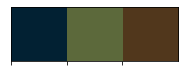

In [15]:
# 2017, 2018, 2019
sns.palplot(["#022133", "#5c693b", "#51371c"])

In [16]:
color_op = ["#022133", "#5c693b", "#51371c"]

trace = go.Scatter(x=train_2017['datetime'], y=train_2017['TARGET'],
                   opacity = 0.8, line = dict(color = color_op[0]), name= 'Target')

# rangeselector를 이용해 원하는 기간별로 볼 수 있는 button을 추가
layout = dict(
    title= "2017 Solar Power Generation by Date",
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label='1d', step='day', stepmode='backward'),
                dict(count=7, label='7d', step='day', stepmode='backward'),
                dict(count=1, label='1m', step='month', stepmode='backward'),
                dict(count=3, label='3m', step='month', stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(visible = True),
        type='date'),
    yaxis=dict(title='Solar Power Generation(kW)')
    )


# creating figure with the both traces and layout
fig = dict(data=trace, layout=layout)

#rendering the graphs
iplot(fig) #it's an equivalent to plt.show()

2017년 월별 추이를 한번에

In [17]:
# 시각화를 위해 month 컬럼 생성
train_2017['month'] = train_2017['datetime'].dt.month

months = ['Jan','Feb','Mar','Apr','May','June','July','Aug','Sep','Oct','Nov','Dec']
L = [1,2,3,4,5,6,7,8,9,10,11,12]
trace = []

for i,m in zip(L,months):
  trace_i = go.Scatter(x=train_2017[train_2017['month']==i]['datetime'], y=train_2017[train_2017['month']==i]['TARGET'],
                   opacity = 0.8, line = dict(color = color_op[0]), name= m)
  layout = dict(
    title= "2017 " + m + " Solar Power Generation",
    xaxis=dict(title='time'),
    yaxis=dict(title='Solar Power Generation(kW)')
  )
  fig = dict(data= trace_i, layout=layout)
  iplot(fig)

In [18]:
# 기후 변수 & TARGET의 월별 평균
train_2017.groupby('month').agg('mean').iloc[:, 3:]

,DHI,DNI,WS,RH,T,TARGET
month,,,,,,
1,34.647177,165.851478,2.468750,68.886929,-0.719758,8.886662
2,45.919643,188.246280,2.624554,63.990208,-0.198661,11.886988
3,55.733871,274.869624,2.457124,58.077883,5.129704,19.459685
4,85.954167,207.093056,2.489931,56.789597,6.919444,19.716347
5,113.456989,135.364247,2.009879,75.566552,9.304435,18.750592
6,101.499306,278.913194,2.064514,62.415340,18.763889,27.029842
7,98.758737,237.477823,2.123790,61.168118,19.657930,23.552734
8,86.815188,239.762769,2.217809,52.813078,20.665995,22.427306
9,61.523611,288.347917,2.031181,46.429972,17.916667,21.210806


In [20]:
# 기후 변수 & TARGET의 월별 최대값
train_2017.groupby('month').agg('max').iloc[:, 3:-1]

,DHI,DNI,WS,RH,T,TARGET
month,,,,,,
1,255,1054,8.0,100.00,16,56.871814
2,336,1040,6.2,97.24,16,71.039720
3,415,1059,6.8,100.00,23,86.231034
4,484,1018,8.0,100.00,23,94.295350
5,511,992,7.3,100.00,24,96.557792
6,528,994,6.4,100.00,33,97.849989
7,523,976,5.7,100.00,31,94.567472
8,489,981,5.8,100.00,33,92.598334
9,446,1010,5.5,100.00,30,84.812375


#### 2018년의 TARGET 추이(day, week, month, 3months, year)

In [21]:
color_op = ["#022133", "#5c693b", "#51371c"]

trace = go.Scatter(x=train_2018['datetime'], y=train_2018['TARGET'],
                   opacity = 0.8, line = dict(color = color_op[1]), name= 'Target')
layout = dict(
    title= "2018 Solar Power Generation by Date",
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label='1d', step='day', stepmode='backward'),
                dict(count=7, label='7d', step='day', stepmode='backward'),
                dict(count=1, label='1m', step='month', stepmode='backward'),
                dict(count=3, label='3m', step='month', stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(visible = True),
        type='date'),
    yaxis=dict(title='Solar Power Generation(kW)')
    )


# creating figure with the both traces and layout
fig = dict(data=trace, layout=layout)

#rendering the graphs
iplot(fig) #it's an equivalent to plt.show()

월별 추이를 한번에

In [24]:
# 시각화를 위해 month 컬럼 생성
train_2018['month'] = train_2018['datetime'].dt.month

months = ['Jan','Feb','Mar','Apr','May','June','July','Aug','Sep','Oct','Nov','Dec']
L = [1,2,3,4,5,6,7,8,9,10,11,12]
trace = []

for i,m in zip(L,months):
  trace_i = go.Scatter(x=train_2018[train_2018['month']==i]['datetime'], y=train_2018[train_2018['month']==i]['TARGET'],
                   opacity = 0.8, line = dict(color = color_op[1]), name= m)
  layout = dict(
    title= "2018 " + m + " Solar Power Generation",
    xaxis=dict(title='time'),
    yaxis=dict(title='Solar Power Generation(kW)')
  )
  fig = dict(data= trace_i, layout=layout)
  iplot(fig)

In [26]:
# 기후 변수 & TARGET의 월별 평균
train_2018.groupby('month').agg('mean').iloc[:, 3:]

,DHI,DNI,WS,RH,T,TARGET
month,,,,,,
1,30.258065,241.717070,2.345228,60.289133,-1.563172,11.076074
2,44.071429,253.817708,3.355283,60.151562,0.609375,14.605963
3,70.959677,212.662634,2.762097,58.140376,2.682796,17.141355
4,90.575000,213.877083,2.832222,63.842590,5.911806,20.583337
5,98.223118,229.213038,2.314113,60.768434,10.659946,23.032883
6,84.032639,325.380556,2.325556,51.347750,20.394444,28.909637
7,90.637769,287.435484,2.331250,45.678522,22.358871,26.019021
8,81.409274,241.566532,2.305847,55.050269,19.095430,22.308604
9,56.024306,295.146528,2.160347,46.314340,16.535417,20.805002


In [27]:
# 기후 변수 & TARGET의 월별 최대값
train_2018.groupby('month').agg('max').iloc[:, 3:-1]

,DHI,DNI,WS,RH,T,TARGET
month,,,,,,
1,251,1022,7.9,97.07,11,56.585917
2,333,1043,10.1,95.62,16,73.098659
3,432,1042,10.6,100.00,20,88.397900
4,479,1033,8.9,100.00,22,93.176604
5,512,1022,6.7,100.00,26,98.899357
6,521,1014,5.8,100.00,35,99.913939
7,522,991,5.6,100.00,34,96.536566
8,485,986,6.1,100.00,33,91.656124
9,446,1037,8.0,100.00,30,86.593984


#### 2019년의 TARGET 추이(day, week, month, 3months, year)

In [28]:
color_op = ["#022133", "#5c693b", "#51371c"]

trace = go.Scatter(x=train_2019['datetime'], y=train_2019['TARGET'],
                   opacity = 0.8, line = dict(color = color_op[2]), name= 'Target')
layout = dict(
    title= "2019 Solar Power Generation by Date",
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label='1d', step='day', stepmode='backward'),
                dict(count=7, label='7d', step='day', stepmode='backward'),
                dict(count=1, label='1m', step='month', stepmode='backward'),
                dict(count=3, label='3m', step='month', stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(visible = True),
        type='date'),
    yaxis=dict(title='Solar Power Generation(kW)')
    )


# creating figure with the both traces and layout
fig = dict(data=trace, layout=layout)

#rendering the graphs
iplot(fig) #it's an equivalent to plt.show()

월별 추이를 한번에

In [29]:
# 시각화를 위해 month 컬럼 생성
train_2019['month'] = train_2019['datetime'].dt.month

months = ['Jan','Feb','Mar','Apr','May','June','July','Aug','Sep','Oct','Nov','Dec']
L = [1,2,3,4,5,6,7,8,9,10,11,12]
trace = []

for i,m in zip(L,months):
  trace_i = go.Scatter(x=train_2019[train_2019['month']==i]['datetime'], y=train_2019[train_2019['month']==i]['TARGET'],
                   opacity = 0.8, line = dict(color = color_op[2]), name= m)
  layout = dict(
    title= "2019 " + m + " Solar Power Generation",
    xaxis=dict(title='time'),
    yaxis=dict(title='Solar Power Generation(kW)')
  )
  fig = dict(data= trace_i, layout=layout)
  iplot(fig)

In [30]:
# 기후 변수 & TARGET의 월별 평균
train_2019.groupby('month').agg('mean').iloc[:, 3:]

,DHI,DNI,WS,RH,T,TARGET
month,,,,,,
1,34.363575,179.642473,2.740995,63.273999,-2.461022,9.370580
2,46.835565,226.602679,2.998289,60.080655,1.643601,13.782520
3,61.166667,237.004032,3.284543,54.792292,5.994624,17.701925
4,85.961806,265.347222,2.860278,54.978903,7.129861,23.429798
5,96.579301,250.282258,2.655309,60.758824,10.948925,24.221582
6,97.520139,296.668056,2.387708,47.759917,19.380556,27.094199
7,93.029570,217.557796,2.287970,53.376243,21.797043,22.390985
8,85.659946,230.538978,2.128360,55.259120,19.340054,21.628747
9,66.349306,199.668750,2.182917,56.183229,15.523611,17.013454


In [31]:
# 기후 변수 & TARGET의 월별 최대값
train_2019.groupby('month').agg('max').iloc[:, 3:-1]

,DHI,DNI,WS,RH,T,TARGET
month,,,,,,
1,255,1040,12.0,97.07,10,55.651791
2,338,1059,9.0,96.94,17,73.483696
3,430,1039,9.6,100.00,23,84.078457
4,489,1036,7.7,100.00,24,99.563844
5,505,1006,6.4,100.00,27,99.747138
6,523,1009,8.2,100.00,34,99.453605
7,512,997,6.2,100.00,35,98.321230
8,492,968,5.5,100.00,32,93.349904
9,420,1006,7.1,100.00,33,85.183905


* 특정한 날들은 정규분포 처럼 매끄러움 -> 저런날들은 구름이 아예 없는 날인가?
* 일반적으로 여름의 태양광 발전량 구간이 제일 길고 높이도 제일 높음
* 다른 시각화들을 진행해보고 TARGET과 직접적인 관련이 있을 것 같은 'DNI' 와 'DHI'도 시각화 할 필요성 느낌

## barplot을 이용한 월별 시각화

In [38]:
# 월별 시각화를 위한 데이터셋 준비
train['month'] = train['datetime'].dt.month
train_month = train.groupby('month').agg('mean').iloc[:,3:].reset_index(inplace=False)
train_month

,month,DHI,DNI,WS,RH,T,TARGET
0,1,33.089606,195.737007,2.518324,64.150020,-1.581317,9.777772
1,2,45.608879,222.888889,2.992708,61.407475,0.684772,13.425157
2,3,62.620072,241.512097,2.834588,57.003517,4.602375,18.100988
3,4,87.496991,228.772454,2.727477,58.537030,6.653704,21.243161
4,5,102.753136,204.953181,2.326434,65.697937,10.304435,22.001686
5,6,94.350694,300.320602,2.259259,53.841002,19.512963,27.677893
6,7,94.142025,247.490367,2.247670,53.407628,21.271281,23.987580
7,8,84.628136,237.289427,2.217339,54.374155,19.700493,22.121552
8,9,61.299074,261.054398,2.124815,49.642514,16.658565,19.676421
9,10,45.653674,240.735663,2.252352,52.297941,10.373656,14.919986


## 월별 TARGET, DHI, DNI, T

* 태양광 관련 문서를 통해 주어진 변수 중 DHI, DNI, T가 태양광에 가장 큰 영향을 미칠 것이라 판단

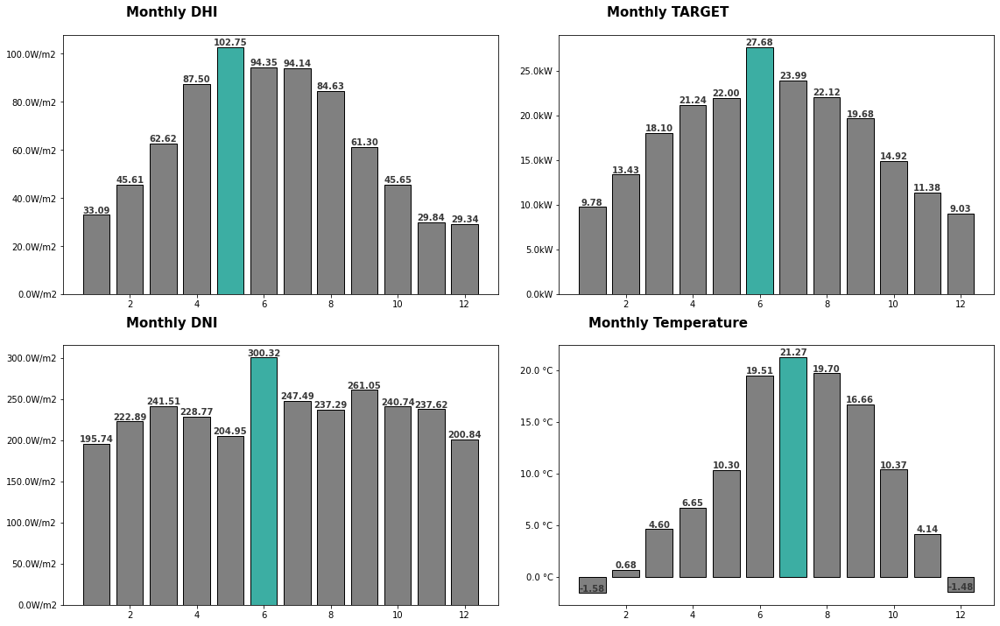

In [39]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(2, 2, figsize=(16, 10))

# ax1
color_map = ['gray' for _ in range(12)]
color_map[4] = '#3caea3'
ax[0][0].bar(train_month['month'], train_month['DHI'], edgecolor='black', color=color_map)
for i in train_month['DHI'].index:
    ax[0][0].annotate(f"{train_month['DHI'][i]:.02f}", 
                   xy=(i+1, train_month['DHI'][i]),
                   va = 'bottom', ha='center',fontweight='bold', color='#383838'
                  )
    

   
ax[0][0].yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{y:}W/m2')) 
ax[0][0].set_title('Monthly DHI', fontsize=15, fontweight='bold', position=(0.25, 1.0+0.05))
#plt.suptitle('* Focus on the highest DHI', x=0.65, y=0.94, color='gray')
plt.subplots_adjust(left=0.5, right=0.8)

# ax2
color_map = ['gray' for _ in range(12)]
color_map[5] = '#3caea3'
ax[0][1].bar(train_month['month'], train_month['TARGET'], edgecolor='black', color=color_map)
for i in train_month['TARGET'].index:
    ax[0][1].annotate(f"{train_month['TARGET'][i]:.02f}", 
                   xy=(i+1, train_month['TARGET'][i]),
                   va = 'bottom', ha='center',fontweight='bold', color='#383838'
                  )
    

   
ax[0][1].yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{y:}kW')) 
ax[0][1].set_title('Monthly TARGET', fontsize=15, fontweight='bold', position=(0.25, 1.0+0.05))
#plt.suptitle('* Focus on the highest month', x=0.65, y=0.94, color='gray')
plt.subplots_adjust(left=0.5, right=0.8)

# ax3
color_map = ['gray' for _ in range(12)]
color_map[5] = '#3caea3'
ax[1][0].bar(train_month['month'], train_month['DNI'], edgecolor='black', color=color_map)
for i in train_month['DNI'].index:
    ax[1][0].annotate(f"{train_month['DNI'][i]:.02f}", 
                   xy=(i+1, train_month['DNI'][i]),
                   va = 'bottom', ha='center',fontweight='bold', color='#383838'
                  )
    

   
ax[1][0].yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{y:}W/m2')) 
ax[1][0].set_title('Monthly DNI', fontsize=15, fontweight='bold', position=(0.25, 1.0+0.05))
#plt.suptitle('* Focus on the highest month', x=0.65, y=0.94, color='gray')
plt.subplots_adjust(left=0.5, right=0.8)

# ax4
color_map = ['gray' for _ in range(12)]
color_map[6] = '#3caea3'
ax[1][1].bar(train_month['month'], train_month['T'], edgecolor='black', color=color_map)
for i in train_month['T'].index:
    ax[1][1].annotate(f"{train_month['T'][i]:.02f}", 
                   xy=(i+1, train_month['T'][i]),
                   va = 'bottom', ha='center',fontweight='bold', color='#383838'
                  )
    

   
ax[1][1].yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{y:} °C')) 
ax[1][1].set_title('Monthly Temperature', fontsize=15, fontweight='bold', position=(0.25, 1.0+0.05))
#plt.suptitle('* Focus on the highest month', x=0.65, y=0.94, color='gray')
plt.subplots_adjust(left=0.5, right=0.8)
plt.tight_layout()
plt.show()

## TARGET에 집중한 월별 barplot

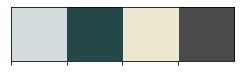

In [40]:
sns.palplot(['#d4dddd', '#244747', '#efe8d1', '#4a4a4a'])

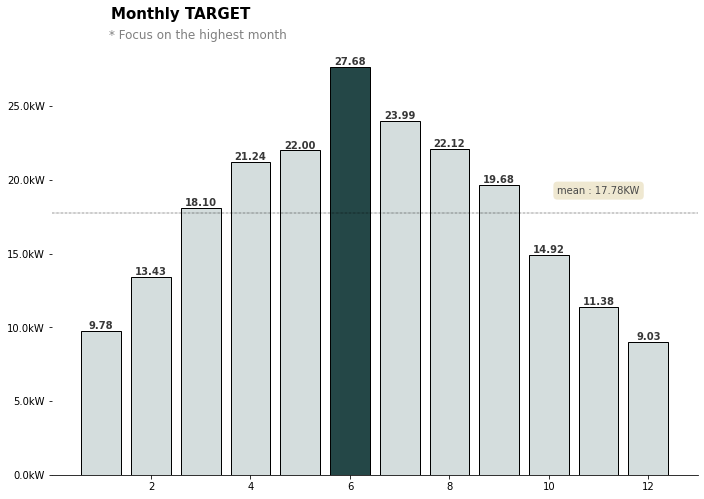

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(10, 7))

color_map = ['#d4dddd' for _ in range(12)]
color_map[5] = '#244747'
ax.bar(train_month['month'], train_month['TARGET'], edgecolor='black', color=color_map)

for i in train_month['TARGET'].index:
    ax.annotate(f"{train_month['TARGET'][i]:.02f}", 
                   xy=(i+1, train_month['TARGET'][i]),
                   va = 'bottom', ha='center',fontweight='bold', color='#383838'
                  )

mean = train_month['TARGET'].mean()
ax.axhline(mean ,color='black', linewidth=0.4, linestyle='dashdot')
ax.annotate(f"mean : {mean :.4}KW", 
            xy=(11, mean + 1.5),
            va = 'center', ha='center',
            color='#4a4a4a',
            bbox=dict(boxstyle='round', pad=0.4, facecolor='#efe8d1', linewidth=0))

for s in ["top","right","left"]:
    ax.spines[s].set_visible(False)
   
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{y:}kW')) 
ax.set_title('Monthly TARGET', fontsize=15, fontweight='bold', position=(0.20, 1.0+0.05))
plt.suptitle('* Focus on the highest month', x=0.28, y=0.94, color='gray')
plt.subplots_adjust(left=0.5, right=0.8)
plt.tight_layout()
plt.show()

## Scatter plot & heatmap

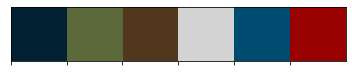

In [42]:
sns.palplot(["#022133", "#5c693b", "#51371c", "lightgray","#004c70","#990000"])

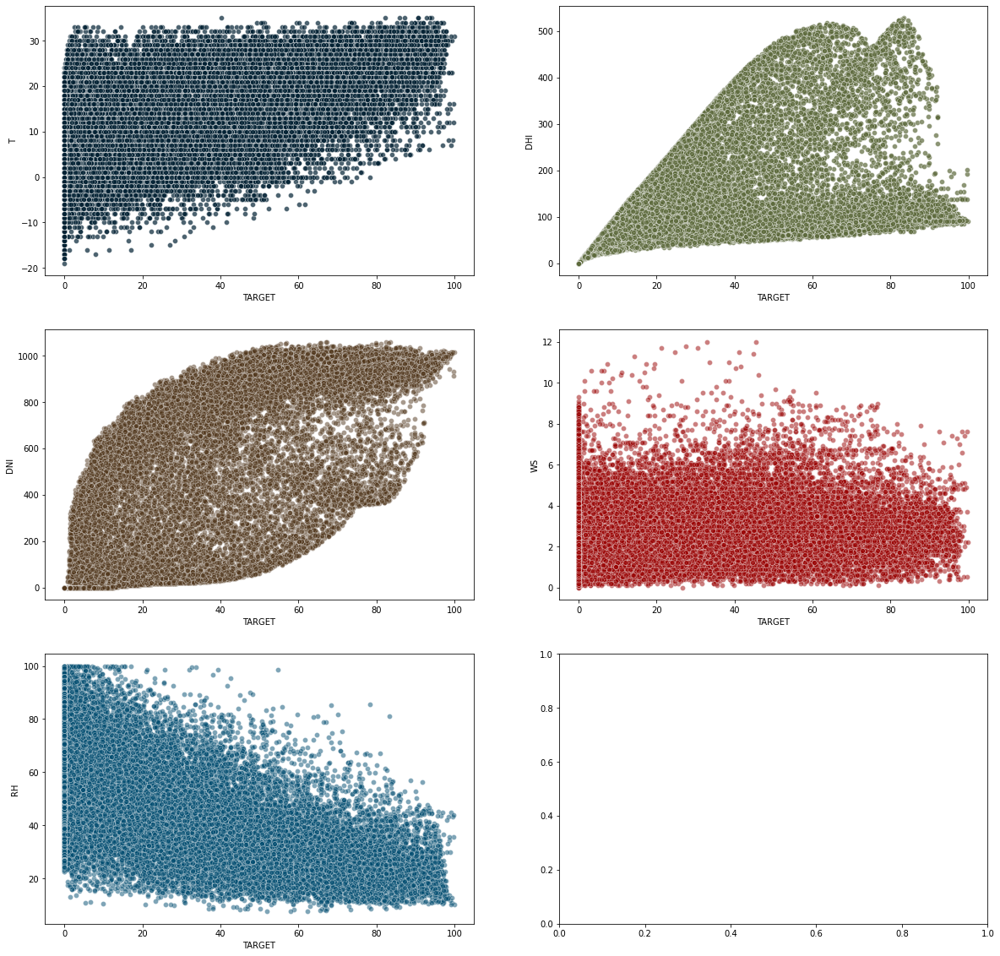

In [43]:
fig, ax = plt.subplots(3, 2, figsize=(20, 20))

color_op = ["#022133", "#5c693b", "#51371c", "lightgray","#004c70","#990000"]

sns.scatterplot(data=train, x='TARGET', y='T', color=color_op[0], alpha=0.7, ax=ax[0][0])

sns.scatterplot(data=train, x='TARGET', y='DHI', color=color_op[1], alpha=0.7, ax=ax[0][1])

sns.scatterplot(data=train, x='TARGET', y='DNI', color=color_op[2], alpha=0.5, ax=ax[1][0])

sns.scatterplot(data=train, x='TARGET', y='WS', color=color_op[5], alpha=0.5, ax=ax[1][1])

sns.scatterplot(data=train, x='TARGET', y='RH', color=color_op[4], alpha=0.5, ax=ax[2][0])

plt.show()

* DHI, DNI는 TARGET과 양의 상관관계를 지니는 것으로 보임
* RH는 TARGET과 음의 상관관계를 지니는 것으로 보임
* TARGET의 0 값이 너무 많아서 scatterplot으로 파악하기는 힘들어 보임

In [44]:
corr_matrix = train[['DHI','DNI','WS','RH','T','TARGET']].corr()
corr_matrix['TARGET'].sort_values(ascending=False)

TARGET    1.000000
DNI       0.833547
DHI       0.666908
T         0.561990
WS        0.238521
RH       -0.677178
Name: TARGET, dtype: float64

In [45]:
sns.color_palette(sns.diverging_palette(230, 20))

[(0.2509335357076959, 0.4944143311197457, 0.6104170295454565),
 (0.5266567751883763, 0.6751928585334119, 0.7467240840661897),
 (0.8050726244296104, 0.8577368012538521, 0.884362262166227),
 (0.9140860646530862, 0.8246826885128927, 0.8028133239419792),
 (0.8384144678873866, 0.5785740917778832, 0.5129511551488873),
 (0.7634747047461135, 0.3348456555528834, 0.225892295531744)]

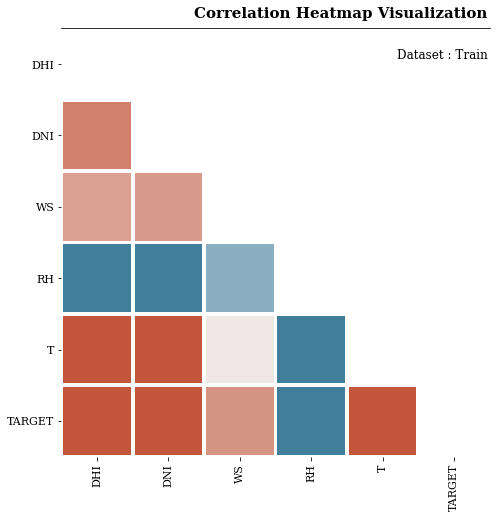

In [46]:
fig, ax = plt.subplots(1, 1, figsize=(7, 7))

mask = np.zeros_like(corr_matrix, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(corr_matrix, 
            square=True, 
            mask=mask,
            linewidth=2.5, 
            vmax=0.4, vmin=-0.4, 
            cmap=cmap, 
            cbar=False, 
            ax=ax)

ax.set_yticklabels(ax.get_xticklabels(), fontfamily='serif', rotation = 0, fontsize=11)
ax.set_xticklabels(ax.get_xticklabels(), fontfamily='serif', rotation=90, fontsize=11)

ax.spines['top'].set_visible(True)

fig.text(0.97, 1, 'Correlation Heatmap Visualization', fontweight='bold', fontfamily='serif', fontsize=15, ha='right')    
fig.text(0.97, 0.92, 'Dataset : Train', fontweight='light', fontfamily='serif', fontsize=12, ha='right')    

plt.tight_layout()
plt.show()

## 해가 뜨고 지는 시간 유추(Target, DHI, DNI 값을 통해)



#### 2017년 TARGET, DHI, DNI 추이

In [47]:
color_op = ["#022133", "#5c693b", "#51371c"]

selector_dic = dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label='1d', step='day', stepmode='backward'),
                dict(count=7, label='7d', step='day', stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(visible = False),
        type='date')

from plotly.subplots import make_subplots
months = ['Jan','Feb','Mar','Apr','May','June','July','Aug','Sep','Oct','Nov','Dec']
L = [1,2,3,4,5,6,7,8,9,10,11,12]
trace = []
for i,m in zip(L,months):
  fig = make_subplots(rows=3, cols=1, vertical_spacing=0.15)
  
  fig.add_trace(
    go.Scatter(x=train_2017[train_2017["month"] == i]['datetime'], y=train_2017[train_2017["month"] == i]['DNI'],
                    opacity = 0.8, line = dict(color = color_op[0]), name= 'DNI'),
              row=1, col=1)
  
  fig.add_trace(
    go.Scatter(x=train_2017[train_2017["month"] == i]['datetime'], y=train_2017[train_2017["month"] == i]['DHI'],
                    opacity = 0.8, line = dict(color = color_op[1]), name= 'DHI',xaxis='x2',yaxis='y2'),
              row=2, col=1)
  
  fig.add_trace(
    go.Scatter(x=train_2017[train_2017["month"] == i]['datetime'], y=train_2017[train_2017["month"] == i]['TARGET'],
                    opacity = 0.8, line = dict(color = color_op[2]), name= 'TARGET',xaxis='x3',yaxis='y3'),
              row=3, col=1)
  fig.update_layout(dict(
    xaxis=selector_dic,
    xaxis2=selector_dic,
    xaxis3=selector_dic,
    title=  m + " 2017",
    yaxis=dict(title='DNI'),
    yaxis2=dict(title='DHI'),
    yaxis3=dict(title='Solar Energy'),
    width=800,height=600
    ))
  fig.show()

#### 2018년 TARGET, DHI, DNI 추이

In [48]:
color_op = ["#022133", "#5c693b", "#51371c"]

selector_dic = dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label='1d', step='day', stepmode='backward'),
                dict(count=7, label='7d', step='day', stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(visible = False),
        type='date')

from plotly.subplots import make_subplots
months = ['Jan','Feb','Mar','Apr','May','June','July','Aug','Sep','Oct','Nov','Dec']
L = [1,2,3,4,5,6,7,8,9,10,11,12]
trace = []
for i,m in zip(L,months):
  fig = make_subplots(rows=3, cols=1, vertical_spacing=0.15)
  
  fig.add_trace(
    go.Scatter(x=train_2018[train_2018["month"] == i]['datetime'], y=train_2018[train_2018["month"] == i]['DNI'],
                    opacity = 0.8, line = dict(color = color_op[0]), name= 'DNI'),
              row=1, col=1)
  
  fig.add_trace(
    go.Scatter(x=train_2018[train_2018["month"] == i]['datetime'], y=train_2018[train_2018["month"] == i]['DHI'],
                    opacity = 0.8, line = dict(color = color_op[1]), name= 'DHI',xaxis='x2',yaxis='y2'),
              row=2, col=1)
  
  fig.add_trace(
    go.Scatter(x=train_2018[train_2018["month"] == i]['datetime'], y=train_2018[train_2018["month"] == i]['TARGET'],
                    opacity = 0.8, line = dict(color = color_op[2]), name= 'TARGET',xaxis='x3',yaxis='y3'),
              row=3, col=1)
  fig.update_layout(dict(
    xaxis=selector_dic,
    xaxis2=selector_dic,
    xaxis3=selector_dic,
    title=  m + " 2018",
    yaxis=dict(title='DNI'),
    yaxis2=dict(title='DHI'),
    yaxis3=dict(title='Solar Energy'),
    width=800,height=600
    ))
  fig.show()

#### 2019년 TARGET, DHI, DNI 추이

In [49]:
color_op = ["#022133", "#5c693b", "#51371c"]

selector_dic = dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label='1d', step='day', stepmode='backward'),
                dict(count=7, label='7d', step='day', stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(visible = False),
        type='date')

from plotly.subplots import make_subplots
months = ['Jan','Feb','Mar','Apr','May','June','July','Aug','Sep','Oct','Nov','Dec']
L = [1,2,3,4,5,6,7,8,9,10,11,12]
trace = []
for i,m in zip(L,months):
  fig = make_subplots(rows=3, cols=1, vertical_spacing=0.15)
  
  fig.add_trace(
    go.Scatter(x=train_2019[train_2019["month"] == i]['datetime'], y=train_2019[train_2019["month"] == i]['DNI'],
                    opacity = 0.8, line = dict(color = color_op[0]), name= 'DNI'),
              row=1, col=1)
  
  fig.add_trace(
    go.Scatter(x=train_2019[train_2019["month"] == i]['datetime'], y=train_2019[train_2019["month"] == i]['DHI'],
                    opacity = 0.8, line = dict(color = color_op[1]), name= 'DHI',xaxis='x2',yaxis='y2'),
              row=2, col=1)
  
  fig.add_trace(
    go.Scatter(x=train_2019[train_2019["month"] == i]['datetime'], y=train_2019[train_2019["month"] == i]['TARGET'],
                    opacity = 0.8, line = dict(color = color_op[2]), name= 'TARGET',xaxis='x3',yaxis='y3'),
              row=3, col=1)
  fig.update_layout(dict(
    xaxis=selector_dic,
    xaxis2=selector_dic,
    xaxis3=selector_dic,
    title=  m + " 2019",
    yaxis=dict(title='DNI'),
    yaxis2=dict(title='DHI'),
    yaxis3=dict(title='Solar Energy'),
    width=800,height=600
    ))
  fig.show()

위의 heatmap(상관계수값)에서도 확인했지만, Target값은 DHI보다 DNI와 더 유사하게 움직인다.